In [2]:
# importing necessary libraries

# Plotting libraries/settings# Plott 
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

# Data manipulation libraries/settings
import numpy as np
import pandas as pd
import pandas_profiling
pd.options.display.max_rows=6
pd.options.display.max_columns=10

# Machine learning library/functions
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
np.random.seed(42)

from matplotlib import rcParams
rcParams.update({'figure.autolayout':True})

# setting visual

plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [3]:
# Print version info for the sake of reproducibility
import sys
import matplotlib as mpl
import sklearn as skl
print("python " + sys.version)
print("")
print("pandas " + str(pd.__version__))
print("numpy " + np.__version__)
print("matplotlib " + mpl.__version__)
print("seaborn " + sns.__version__)
print("sklearn" + skl.__version__)


python 3.9.12 (main, Apr  4 2022, 05:22:27) [MSC v.1916 64 bit (AMD64)]

pandas 1.4.2
numpy 1.21.5
matplotlib 3.5.1
seaborn 0.11.2
sklearn1.0.2


In [16]:
df = pd.read_csv('Crime_Incidents_in_2021.csv')
anc_data = pd.read_csv('ancdata.csv')

In [5]:
print("-----------------")
print("Training Data Set")
print("-----------------")
df.info()

-----------------
Training Data Set
-----------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28329 entries, 0 to 28328
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   X                     28329 non-null  float64
 1   Y                     28329 non-null  float64
 2   CCN                   28329 non-null  int64  
 3   REPORT_DAT            28329 non-null  object 
 4   SHIFT                 28329 non-null  object 
 5   METHOD                28329 non-null  object 
 6   OFFENSE               28329 non-null  object 
 7   BLOCK                 28329 non-null  object 
 8   XBLOCK                28329 non-null  float64
 9   YBLOCK                28329 non-null  float64
 10  WARD                  28329 non-null  int64  
 11  ANC                   28329 non-null  object 
 12  DISTRICT              28154 non-null  float64
 13  PSA                   28144 non-null  float64
 14  NEIGHBORHOOD_CLU

In [6]:
df.head(2)

,X,Y,CCN,REPORT_DAT,SHIFT,...,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID
0,-77.055651,38.935637,21027315,2021/03/03 12:30:03+00,DAY,...,NaN,2021/03/03 06:15:54+00,NaN,245394969,NaN
1,-77.055651,38.935637,21027315,2021/03/03 12:30:03+00,DAY,...,NaN,2021/03/03 06:15:54+00,NaN,245394970,NaN


In [7]:
df.describe()

,X,Y,CCN,XBLOCK,YBLOCK,...,CENSUS_TRACT,LATITUDE,LONGITUDE,OBJECTID,OCTO_RECORD_ID
count,28329.000000,28329.000000,2.832900e+04,28329.000000,28329.000000,...,28327.000000,28329.000000,28329.000000,2.832900e+04,0.0
mean,-77.008508,38.907829,2.110957e+07,399262.820525,137774.136745,...,7480.119533,38.907821,-77.008506,2.457603e+08,NaN
std,0.034752,0.029696,4.871747e+05,3014.104419,3296.565632,...,34831.510396,0.029696,0.034752,1.025964e+05,NaN
...,...,...,...,...,...,...,...,...,...,...,...
50%,-77.012572,38.907833,2.110261e+07,398910.520000,137774.000000,...,7000.000000,38.907825,-77.012569,2.456830e+08,NaN
75%,-76.986911,38.923974,2.114869e+07,401135.800000,139565.760000,...,9000.000000,38.923966,-76.986909,2.458765e+08,NaN
max,-76.910014,38.994225,9.915749e+07,407806.750917,147365.030000,...,980000.000000,38.994217,-76.910012,2.458908e+08,NaN


In [8]:
df.isnull().sum()/len(df)

X                 0.000000
Y                 0.000000
CCN               0.000000
                    ...   
END_DATE          0.093297
OBJECTID          0.000000
OCTO_RECORD_ID    1.000000
Length: 25, dtype: float64

In [9]:
print(df.columns.values)

['X' 'Y' 'CCN' 'REPORT_DAT' 'SHIFT' 'METHOD' 'OFFENSE' 'BLOCK' 'XBLOCK'
 'YBLOCK' 'WARD' 'ANC' 'DISTRICT' 'PSA' 'NEIGHBORHOOD_CLUSTER'
 'BLOCK_GROUP' 'CENSUS_TRACT' 'VOTING_PRECINCT' 'LATITUDE' 'LONGITUDE'
 'BID' 'START_DATE' 'END_DATE' 'OBJECTID' 'OCTO_RECORD_ID']


In [10]:
headers = df.columns.values
print(headers)


['X' 'Y' 'CCN' 'REPORT_DAT' 'SHIFT' 'METHOD' 'OFFENSE' 'BLOCK' 'XBLOCK'
 'YBLOCK' 'WARD' 'ANC' 'DISTRICT' 'PSA' 'NEIGHBORHOOD_CLUSTER'
 'BLOCK_GROUP' 'CENSUS_TRACT' 'VOTING_PRECINCT' 'LATITUDE' 'LONGITUDE'
 'BID' 'START_DATE' 'END_DATE' 'OBJECTID' 'OCTO_RECORD_ID']


In [11]:
for i, j in enumerate(headers):
    print('{} : {}'.format(i,j))

0 : X
1 : Y
2 : CCN
3 : REPORT_DAT
4 : SHIFT
5 : METHOD
6 : OFFENSE
7 : BLOCK
8 : XBLOCK
9 : YBLOCK
10 : WARD
11 : ANC
12 : DISTRICT
13 : PSA
14 : NEIGHBORHOOD_CLUSTER
15 : BLOCK_GROUP
16 : CENSUS_TRACT
17 : VOTING_PRECINCT
18 : LATITUDE
19 : LONGITUDE
20 : BID
21 : START_DATE
22 : END_DATE
23 : OBJECTID
24 : OCTO_RECORD_ID


In [12]:
print(df.shape)
print(df.head(3))

(28329, 25)
           X          Y       CCN              REPORT_DAT    SHIFT  ...  BID  \
0 -77.055651  38.935637  21027315  2021/03/03 12:30:03+00      DAY  ...  NaN   
1 -77.055651  38.935637  21027315  2021/03/03 12:30:03+00      DAY  ...  NaN   
2 -77.010649  38.827796  20185183  2021/01/02 02:28:55+00  EVENING  ...  NaN   

               START_DATE                END_DATE   OBJECTID  OCTO_RECORD_ID  
0  2021/03/03 06:15:54+00                     NaN  245394969             NaN  
1  2021/03/03 06:15:54+00                     NaN  245394970             NaN  
2  2021/01/01 02:09:08+00  2021/01/01 03:51:08+00  245396060             NaN  

[3 rows x 25 columns]


In [13]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
for item in df:
    print (item)
    print (df[item].nunique())

X
6740
Y
6740
CCN
28311
REPORT_DAT
28250
SHIFT
3
METHOD
3
OFFENSE
9
BLOCK
6731
XBLOCK
6645
YBLOCK
6671
WARD
8
ANC
40
DISTRICT
7
PSA
57
NEIGHBORHOOD_CLUSTER
46
BLOCK_GROUP
565
CENSUS_TRACT
206
VOTING_PRECINCT
144
LATITUDE
6740
LONGITUDE
6740
BID
11
START_DATE
26125
END_DATE
23832
OBJECTID
28329
OCTO_RECORD_ID
0


In [17]:
for item in anc_data:
    print (item)
    print (anc_data[item].nunique())


year
8
ANC
40
ANC2
40
ANC3
40
Housing_Prices
80
Unemployment
34


In [19]:
df.columns


Index(['X', 'Y', 'CCN', 'REPORT_DAT', 'SHIFT', 'METHOD', 'OFFENSE', 'BLOCK',
       'XBLOCK', 'YBLOCK', 'WARD', 'ANC', 'DISTRICT', 'PSA',
       'NEIGHBORHOOD_CLUSTER', 'BLOCK_GROUP', 'CENSUS_TRACT',
       'VOTING_PRECINCT', 'LATITUDE', 'LONGITUDE', 'BID', 'START_DATE',
       'END_DATE', 'OBJECTID', 'OCTO_RECORD_ID'],
      dtype='object')

In [20]:
anc_data.columns

Index(['year', 'ANC', 'ANC2', 'ANC3', 'Housing_Prices', 'Unemployment'], dtype='object')

In [21]:
print("Number of unique crime categories:", len(df['BLOCK'].unique()))
print("")
print(df['BLOCK'].unique())

Number of unique crime categories: 6731

['2500 - 2880 BLOCK OF PORTER STREET NW'
 '10 - 199 BLOCK OF DANBURY STREET SW'
 '3200 - 3299 BLOCK OF WOODLAND DRIVE NW' ...
 '1400 - 1499 BLOCK OF HALF STREET SW' '300 - 399 BLOCK OF P STREET NW'
 '4400 - 4499 BLOCK OF 15TH STREET NW']


In [22]:
df.groupby('BLOCK').OFFENSE.value_counts(normalize=True)

BLOCK                                    OFFENSE                   
0 - 0 BLOCK OF ANNA J COOPER CIRCLE NW   THEFT/OTHER                   1.000000
1 - 1 BLOCK OF CHEVY CHASE CIRCLE NW     BURGLARY                      1.000000
1 - 1 BLOCK OF THOMAS CIRCLE NW          THEFT/OTHER                   0.789474
                                                                         ...   
WAHLER PLACE SE AND 9TH STREET SE        THEFT F/AUTO                  1.000000
WESTMINSTER STREET NW AND 9TH STREET NW  THEFT F/AUTO                  1.000000
WHEELER ROAD SE AND VALLEY AVENUE SE     ASSAULT W/DANGEROUS WEAPON    1.000000
Name: OFFENSE, Length: 13470, dtype: float64

In [26]:
df.groupby('METHOD').OFFENSE.value_counts()

METHOD  OFFENSE                   
GUN     ROBBERY                       1110
        ASSAULT W/DANGEROUS WEAPON     930
        HOMICIDE                       184
                                      ... 
OTHERS  SEX ABUSE                      160
        HOMICIDE                        25
        ARSON                            4
Name: OFFENSE, Length: 25, dtype: int64

In [27]:
df.describe()

,X,Y,CCN,XBLOCK,YBLOCK,...,CENSUS_TRACT,LATITUDE,LONGITUDE,OBJECTID,OCTO_RECORD_ID
count,28329.000000,28329.000000,2.832900e+04,28329.000000,28329.000000,...,28327.000000,28329.000000,28329.000000,2.832900e+04,0.0
mean,-77.008508,38.907829,2.110957e+07,399262.820525,137774.136745,...,7480.119533,38.907821,-77.008506,2.457603e+08,NaN
std,0.034752,0.029696,4.871747e+05,3014.104419,3296.565632,...,34831.510396,0.029696,0.034752,1.025964e+05,NaN
...,...,...,...,...,...,...,...,...,...,...,...
50%,-77.012572,38.907833,2.110261e+07,398910.520000,137774.000000,...,7000.000000,38.907825,-77.012569,2.456830e+08,NaN
75%,-76.986911,38.923974,2.114869e+07,401135.800000,139565.760000,...,9000.000000,38.923966,-76.986909,2.458765e+08,NaN
max,-76.910014,38.994225,9.915749e+07,407806.750917,147365.030000,...,980000.000000,38.994217,-76.910012,2.458908e+08,NaN


In [28]:
df.corr()  

,X,Y,CCN,XBLOCK,YBLOCK,...,CENSUS_TRACT,LATITUDE,LONGITUDE,OBJECTID,OCTO_RECORD_ID
X,1.000000,-0.434157,-0.007230,1.000000,-0.434168,...,0.043431,-0.434157,1.000000,-0.027888,NaN
Y,-0.434157,1.000000,-0.003478,-0.434092,1.000000,...,-0.066656,1.000000,-0.434157,0.000591,NaN
CCN,-0.007230,-0.003478,1.000000,-0.007234,-0.003480,...,-0.001131,-0.003478,-0.007230,0.013438,NaN
...,...,...,...,...,...,...,...,...,...,...,...
LONGITUDE,1.000000,-0.434157,-0.007230,1.000000,-0.434168,...,0.043431,-0.434157,1.000000,-0.027888,NaN
OBJECTID,-0.027888,0.000591,0.013438,-0.027896,0.000586,...,-0.004538,0.000591,-0.027888,1.000000,NaN
OCTO_RECORD_ID,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='DISTRICT', ylabel='count'>

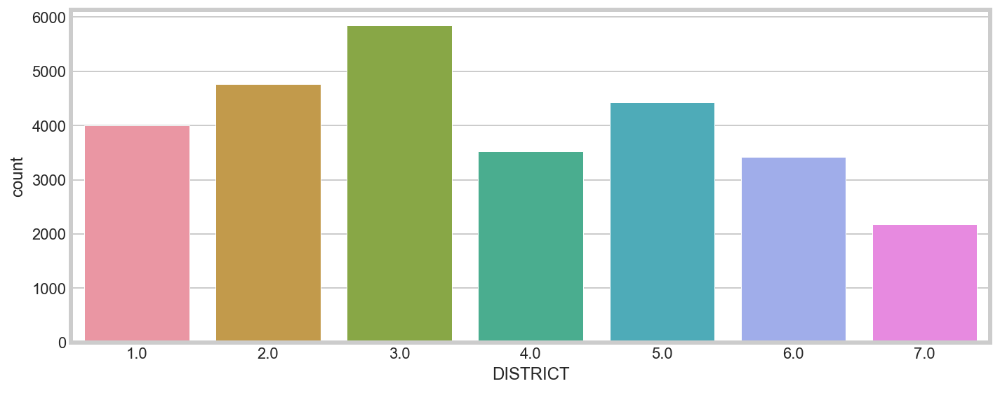

In [29]:
fig,ax =plt.subplots(figsize=(10, 4))
sns.countplot(x='DISTRICT', data=df, ax=ax)

<AxesSubplot:xlabel='SHIFT', ylabel='count'>

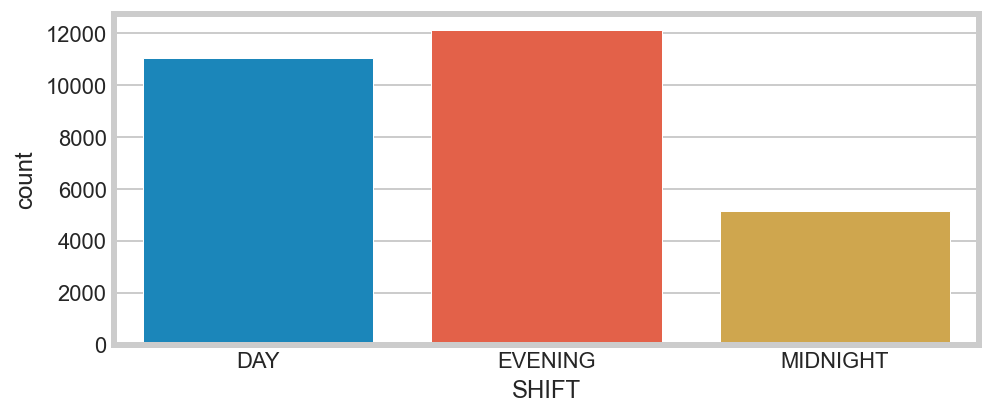

In [30]:
fig, ax = plt.subplots(figsize=(7, 3))
sns.countplot(x='SHIFT', data=df, ax=ax)


In [31]:
print("Number of unique addresses:", len(df['WARD'].unique()))

Number of unique addresses: 8


In [32]:
print("Number of unique addresses:", len(df['SHIFT'].unique()))

Number of unique addresses: 3


In [37]:
# Import the libraries we will need
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import math

# setting the visual
sns.set(font_scale=2)
cmap = sns.diverging_palette(220, 10, as_cmap=True) # one of the many color mappings
sns.set_style('whitegrid')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline    

In [42]:
import pandas as pd

read_file = pd.read_csv (r'warddata.txt')
read_file.to_csv (r'warddata.csv', index=None)
ward_data =pd.read_csv('warddata.csv')

---< offenses categorized>----


<AxesSubplot:xlabel='SHIFT', ylabel='count'>

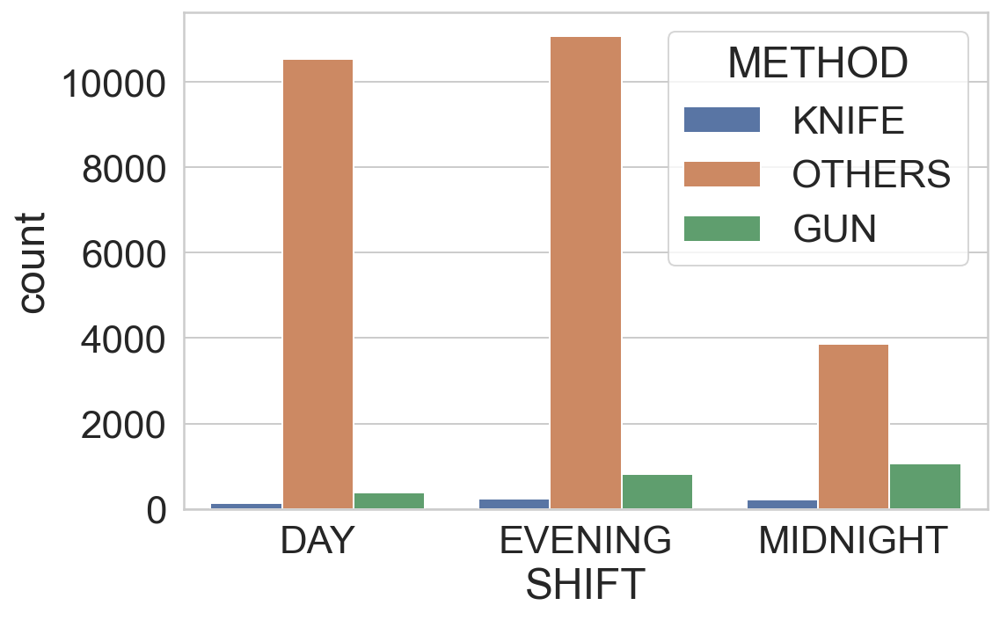

In [44]:
print("---< offenses categorized>----")
tmp = df[['SHIFT', 'METHOD']]
plt.figure(figsize=(8, 5))
sns.countplot(x='SHIFT', hue='METHOD', data=tmp)


<AxesSubplot:xlabel='DISTRICT', ylabel='count'>

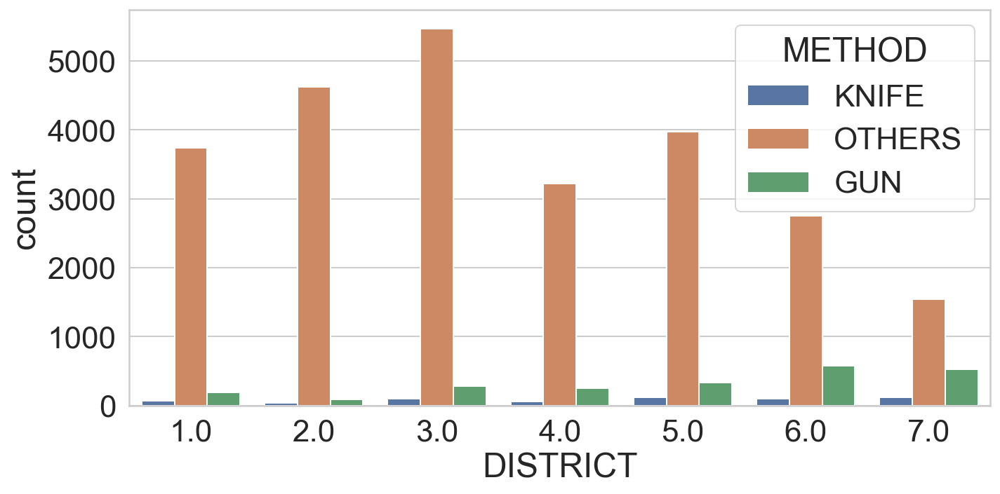

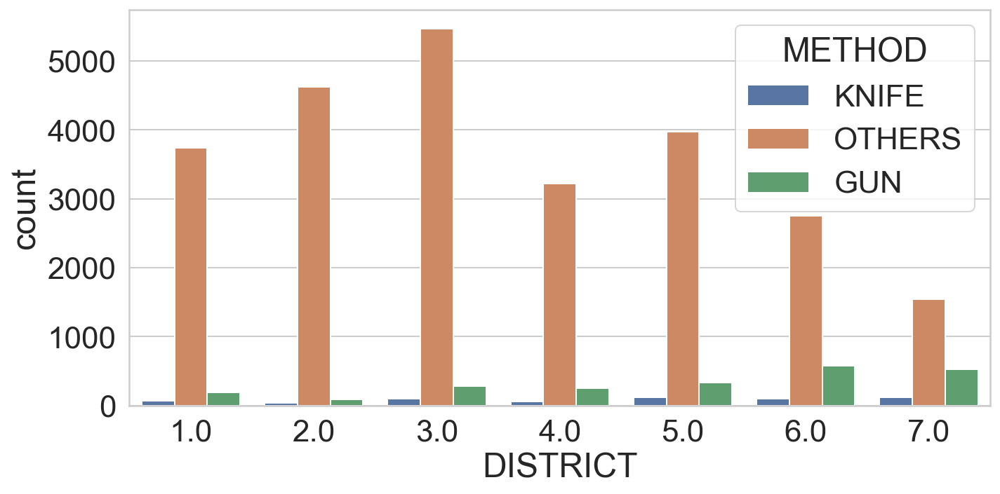

In [47]:
tmp = df[['DISTRICT', 'METHOD']]
tmp1 = df[['DISTRICT', 'METHOD']]
tmp1 = tmp1[tmp1['DISTRICT'] != "OTHERS"]

plt.figure(figsize=(10, 5))
sns.countplot(x='DISTRICT', hue='METHOD', data=tmp)
plt.figure(figsize=(10, 5))
sns.countplot(x='DISTRICT', hue='METHOD', data=tmp1)

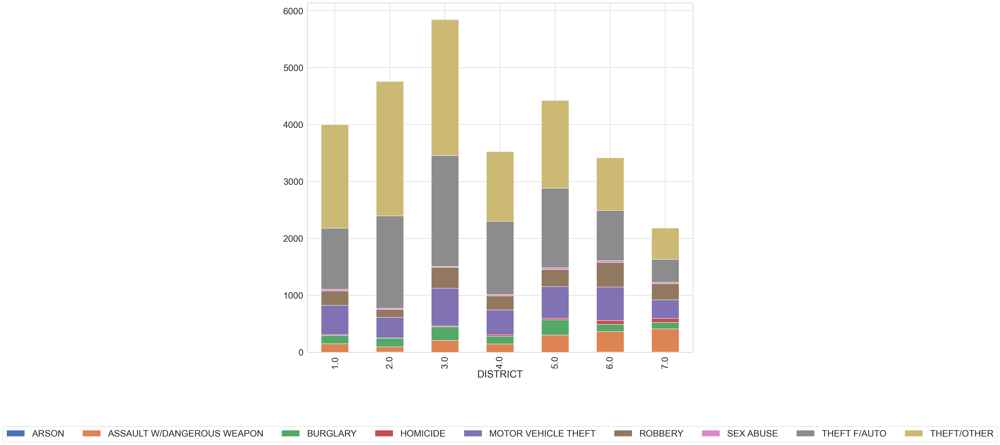

In [49]:
tmp = pd.crosstab(df.DISTRICT, df.OFFENSE)
#print tmpdf

tmp.plot(kind='bar', stacked=True, figsize=(25, 15))
plt.legend(loc=9, bbox_to_anchor=(.5, -.2), ncol=9)

========================== Plot of violent crimes==========================================================


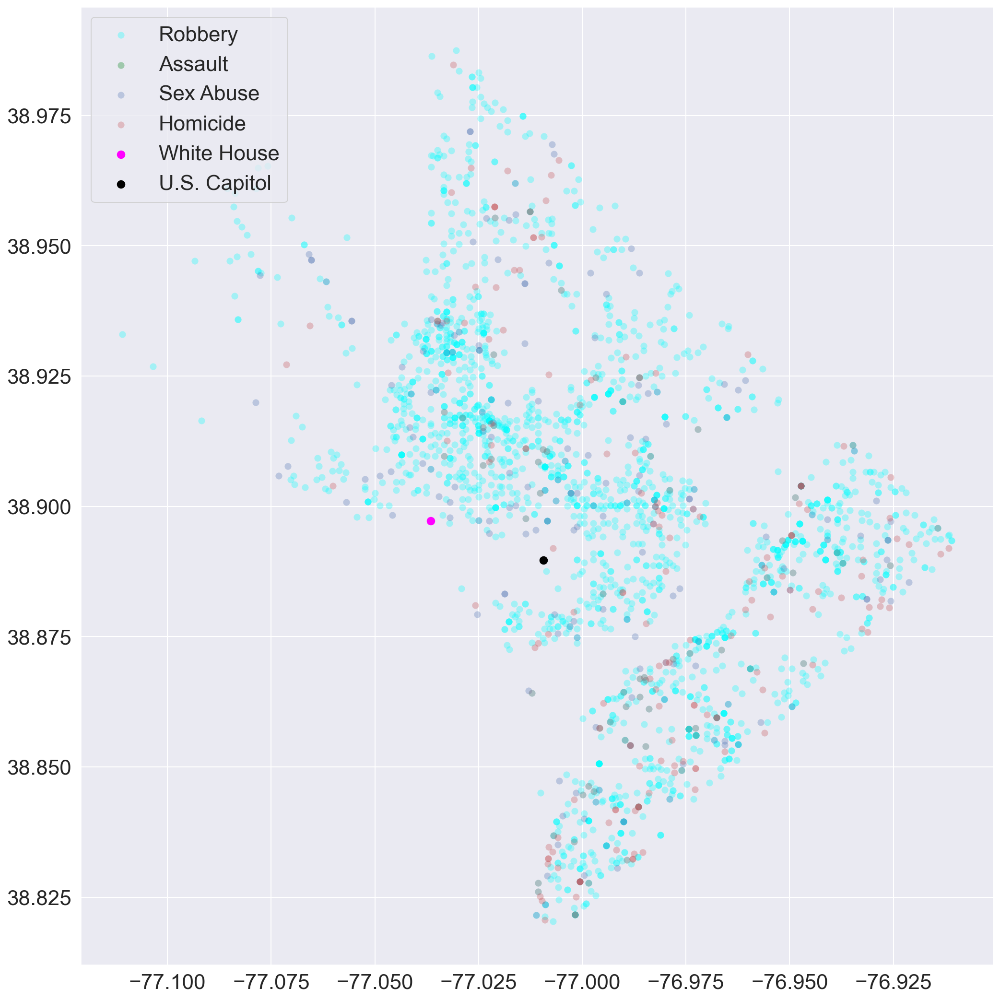

========================== Plot of violent crimes======================================


In [51]:
print("========================== Plot of violent crimes==========================================================")
plt.figure(figsize=(15, 15))
sns.set(font_scale=2)
plt.scatter(df['LONGITUDE'][df['OFFENSE']=='ROBBERY'], df['LATITUDE'][df['OFFENSE']=='ROBBERY'], s=50, alpha=0.3, color=[0.0,1.0,1.0], lw=0, label='Robbery')
plt.scatter(df['LONGITUDE'][df['OFFENSE']=='ASSAULT W/DW'], df['LATITUDE'][df['OFFENSE']=='ASSAULT W/DW'], s=50, alpha=0.5, color='g', lw=0, label='Assault')
plt.scatter(df['LONGITUDE'][df['OFFENSE']=='SEX ABUSE'], df['LATITUDE'][df['OFFENSE']=='SEX ABUSE'], s=50, alpha=0.3, color='b', lw=0, label='Sex Abuse')
plt.scatter(df['LONGITUDE'][df['OFFENSE']=='HOMICIDE'], df['LATITUDE'][df['OFFENSE']=='HOMICIDE'], s=50, alpha=0.3, color='r', lw=0, label='Homicide')
plt.scatter(-77.03654,38.89722,s=60, color=[1,0,1], lw=1, label='White House')
plt.scatter(-77.00937,38.88968,s=60, color=[0,0,0], lw=1, label='U.S. Capitol')
plt.legend(loc='upper left')
plt.show()
print("========================== Plot of violent crimes======================================")